In [1]:
#importing libraries
import pandas as pd
import numpy as np
import warnings
import os

from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.linear_model import LinearRegression, Lasso, ElasticNet
from sklearn.kernel_ridge import KernelRidge

from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import GradientBoostingRegressor
import xgboost as xgb

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error
# Global settings

warnings.filterwarnings("ignore") # To ignore warnings
n_jobs = -1 # This parameter conrols the parallel processing. -1 means using all processors.
random_state = 42 # This parameter controls the randomness of the data. Using some int value to get same results everytime this code is run.

In [2]:

from pandas_profiling import ProfileReport
#importing required packages
import pandas_profiling
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [3]:
#importing the data
df = pd.read_excel('C:/Users/Akhil/Downloads/Crop ROI edited.xlsx')
df


,District_Name,Season,Crop,Crop_Duration,Nitrogen,phosphorus,potassium,ph,Pesticides,Yield bags/ha,Seeds kgs/ha,Cost for Cultivation Rs\ha,Cost of pesticides,Investment cost,Price,Net income,ROI
0,ADILABAD,Kharif,Arhar/Tur,120,25.399955,44.023330,47.866532,7.109764,Azadirachtin,40,15,40000,150,40150,6000,240000,0.167292
1,ADILABAD,Kharif,Arhar/Tur,120,25.942129,43.686642,46.978921,7.419597,Azadirachtin,40,15,40000,150,40150,6000,240000,0.167292
2,ADILABAD,Rabi,Arhar/Tur,120,25.481752,44.183059,47.628207,6.686975,Azadirachtin,40,15,40000,150,40150,6000,240000,0.167292
3,ADILABAD,Kharif,Arhar/Tur,120,29.236268,43.543630,48.151850,7.505164,Azadirachtin,40,15,40000,150,40150,6000,240000,0.167292
4,ADILABAD,Rabi,Arhar/Tur,120,27.062090,44.683242,48.497706,7.435820,Azadirachtin,40,15,40000,150,40150,6000,240000,0.167292
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4915,WARANGAL,Rabi,Wheat,230,60.324727,29.907642,28.842461,6.966914,organophosphates,30,20,13000,1100,14100,1750,52500,0.268571
4916,WARANGAL,Rabi,Wheat,230,60.077498,30.760258,30.008775,6.792731,organophosphates,30,20,13000,1100,14100,1750,52500,0.268571
4917,WARANGAL,Rabi,Wheat,230,60.527319,30.894878,29.131273,6.107228,organophosphates,30,20,13000,1100,14100,1750,52500,0.268571
4918,WARANGAL,Rabi,Wheat,230,60.301643,29.267801,28.669416,6.253218,organophosphates,30,20,13000,1100,14100,1750,52500,0.268571


In [4]:
#descriptive statistics
pandas_profiling.ProfileReport(df)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df = df.drop(["Cost for Cultivation Rs\ha","Cost of pesticides","Price","District_Name","Pesticides"], axis=1)

In [6]:
df.isna().sum()

Season              0
Crop                0
Crop_Duration       0
Nitrogen            0
phosphorus          0
potassium           0
ph                  0
Yield bags/ha       0
Seeds kgs/ha        0
Investment cost     0
Net income          0
ROI                 0
dtype: int64

In [7]:
df.columns

Index(['Season', 'Crop', 'Crop_Duration', 'Nitrogen', 'phosphorus',
       'potassium', 'ph', 'Yield bags/ha', 'Seeds kgs/ha', 'Investment cost ',
       'Net income', 'ROI'],
      dtype='object')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4920 entries, 0 to 4919
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Season            4920 non-null   object 
 1   Crop              4920 non-null   object 
 2   Crop_Duration     4920 non-null   int64  
 3   Nitrogen          4920 non-null   float64
 4   phosphorus        4920 non-null   float64
 5   potassium         4920 non-null   float64
 6   ph                4920 non-null   float64
 7   Yield bags/ha     4920 non-null   int64  
 8   Seeds kgs/ha      4920 non-null   int64  
 9   Investment cost   4920 non-null   int64  
 10  Net income        4920 non-null   int64  
 11  ROI               4920 non-null   float64
dtypes: float64(5), int64(5), object(2)
memory usage: 461.4+ KB


In [9]:
from sklearn.preprocessing import normalize, LabelEncoder
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
label_encoder = preprocessing.LabelEncoder()
df["Season"]= label_encoder.fit_transform(df["Season"]) 
df["Crop"]= label_encoder.fit_transform(df["Crop"]) 

In [10]:
#Normalizing The data
std_scale=StandardScaler()
std_scale
StandardScaler(copy=True,with_mean=True,with_std=True)
df['Crop_Duration']=std_scale.fit_transform(df[['Crop_Duration']])
df['Nitrogen']=std_scale.fit_transform(df[['Nitrogen']])
df['phosphorus']=std_scale.fit_transform(df[['phosphorus']])
df['potassium']=std_scale.fit_transform(df[['potassium']])
df['Yield bags/ha']=std_scale.fit_transform(df[['Yield bags/ha']])
df['Seeds kgs/ha']=std_scale.fit_transform(df[['Seeds kgs/ha']])
df['ph']=std_scale.fit_transform(df[['ph']])
df['Net income']=std_scale.fit_transform(df[['Net income']])
df['Investment cost ']=std_scale.fit_transform(df[['Investment cost ']])
df['Season']=std_scale.fit_transform(df[['Season']])
df['Crop']=std_scale.fit_transform(df[['Crop']])





In [11]:
df

,Season,Crop,Crop_Duration,Nitrogen,phosphorus,potassium,ph,Yield bags/ha,Seeds kgs/ha,Investment cost,Net income,ROI
0,-0.984334,-1.812689,-0.081881,-0.687820,0.307053,0.839440,0.861380,1.841408,0.242972,0.733000,1.789533,0.167292
1,-0.984334,-1.812689,-0.081881,-0.675008,0.290406,0.790427,1.203643,1.841408,0.242972,0.733000,1.789533,0.167292
2,0.400942,-1.812689,-0.081881,-0.685888,0.314951,0.826280,0.394337,1.841408,0.242972,0.733000,1.789533,0.167292
3,-0.984334,-1.812689,-0.081881,-0.597163,0.283334,0.855195,1.298167,1.841408,0.242972,0.733000,1.789533,0.167292
4,0.400942,-1.812689,-0.081881,-0.648542,0.339682,0.874292,1.221565,1.841408,0.242972,0.733000,1.789533,0.167292
...,...,...,...,...,...,...,...,...,...,...,...,...
4915,0.400942,1.634868,1.528951,0.137504,-0.390893,-0.211045,0.703578,0.754354,0.711397,-0.774774,-0.238284,0.268571
4916,0.400942,1.634868,1.528951,0.131662,-0.348736,-0.146643,0.511163,0.754354,0.711397,-0.774774,-0.238284,0.268571
4917,0.400942,1.634868,1.528951,0.142292,-0.342079,-0.195097,-0.246093,0.754354,0.711397,-0.774774,-0.238284,0.268571
4918,0.400942,1.634868,1.528951,0.136958,-0.422530,-0.220600,-0.084822,0.754354,0.711397,-0.774774,-0.238284,0.268571


In [12]:
from statsmodels.stats.outliers_influence import variance_inflation_factor



# the independent variables set
X = df[['Crop_Duration', 'Nitrogen',
       'phosphorus', 'potassium', 'ph', 'Yield bags/ha',
       'Seeds kgs/ha',
       'Investment cost ', 'Net income']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["ROI"] = X.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(X.values, i)
 for i in range(len(X.columns))]

print(vif_data)

                ROI       VIF
0     Crop_Duration  1.959404
1          Nitrogen  4.836588
2        phosphorus  3.456315
3         potassium  5.199540
4                ph  1.579866
5     Yield bags/ha  2.189427
6      Seeds kgs/ha  2.489269
7  Investment cost   1.433821
8        Net income  2.900719


array([[<AxesSubplot:title={'center':'Season'}>,
        <AxesSubplot:title={'center':'Crop'}>,
        <AxesSubplot:title={'center':'Crop_Duration'}>],
       [<AxesSubplot:title={'center':'Nitrogen'}>,
        <AxesSubplot:title={'center':'phosphorus'}>,
        <AxesSubplot:title={'center':'potassium'}>],
       [<AxesSubplot:title={'center':'ph'}>,
        <AxesSubplot:title={'center':'Yield bags/ha'}>,
        <AxesSubplot:title={'center':'Seeds kgs/ha'}>],
       [<AxesSubplot:title={'center':'Investment cost '}>,
        <AxesSubplot:title={'center':'Net income'}>,
        <AxesSubplot:title={'center':'ROI'}>]], dtype=object)

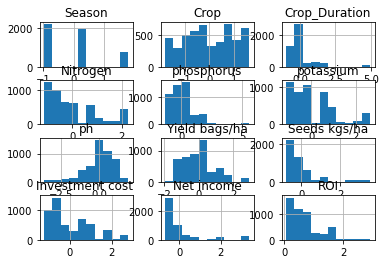

In [13]:
df.hist()

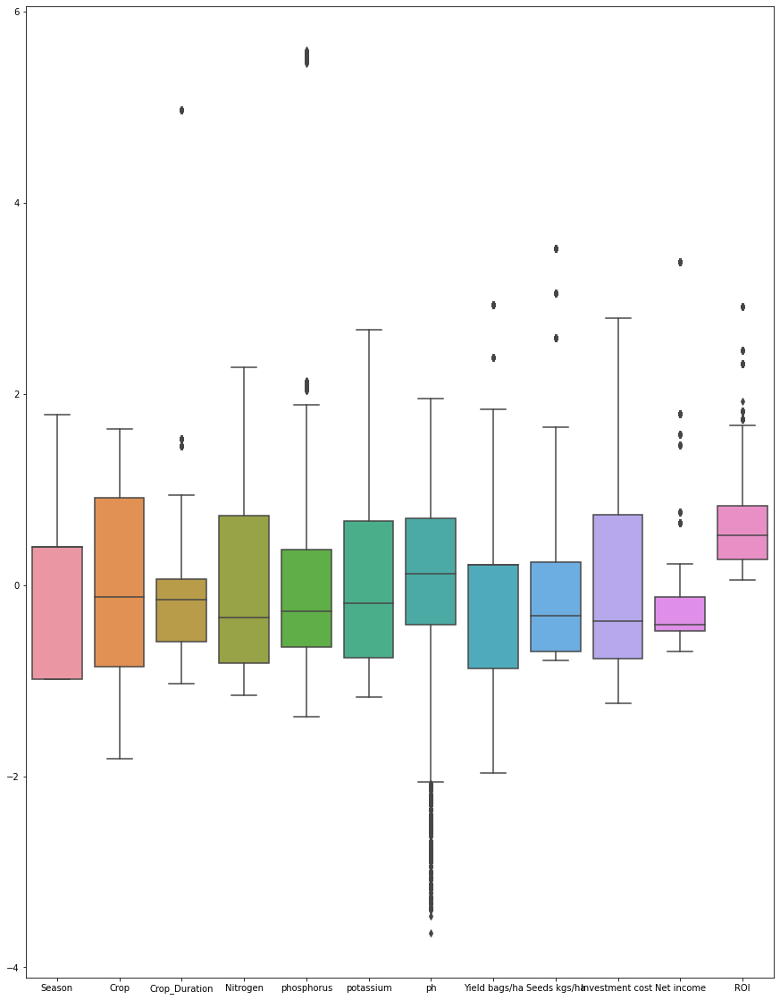

In [14]:
fig=plt.figure(figsize=(15,20))
sns.boxplot(data=df)
plt.show()

In [15]:
df

,Season,Crop,Crop_Duration,Nitrogen,phosphorus,potassium,ph,Yield bags/ha,Seeds kgs/ha,Investment cost,Net income,ROI
0,-0.984334,-1.812689,-0.081881,-0.687820,0.307053,0.839440,0.861380,1.841408,0.242972,0.733000,1.789533,0.167292
1,-0.984334,-1.812689,-0.081881,-0.675008,0.290406,0.790427,1.203643,1.841408,0.242972,0.733000,1.789533,0.167292
2,0.400942,-1.812689,-0.081881,-0.685888,0.314951,0.826280,0.394337,1.841408,0.242972,0.733000,1.789533,0.167292
3,-0.984334,-1.812689,-0.081881,-0.597163,0.283334,0.855195,1.298167,1.841408,0.242972,0.733000,1.789533,0.167292
4,0.400942,-1.812689,-0.081881,-0.648542,0.339682,0.874292,1.221565,1.841408,0.242972,0.733000,1.789533,0.167292
...,...,...,...,...,...,...,...,...,...,...,...,...
4915,0.400942,1.634868,1.528951,0.137504,-0.390893,-0.211045,0.703578,0.754354,0.711397,-0.774774,-0.238284,0.268571
4916,0.400942,1.634868,1.528951,0.131662,-0.348736,-0.146643,0.511163,0.754354,0.711397,-0.774774,-0.238284,0.268571
4917,0.400942,1.634868,1.528951,0.142292,-0.342079,-0.195097,-0.246093,0.754354,0.711397,-0.774774,-0.238284,0.268571
4918,0.400942,1.634868,1.528951,0.136958,-0.422530,-0.220600,-0.084822,0.754354,0.711397,-0.774774,-0.238284,0.268571


In [16]:
duplicate = df.duplicated()
sum(duplicate)

1342

In [17]:
#remove duplicate and get new df
df2=df.drop_duplicates()
df2

,Season,Crop,Crop_Duration,Nitrogen,phosphorus,potassium,ph,Yield bags/ha,Seeds kgs/ha,Investment cost,Net income,ROI
0,-0.984334,-1.812689,-0.081881,-0.687820,0.307053,0.839440,0.861380,1.841408,0.242972,0.733000,1.789533,0.167292
1,-0.984334,-1.812689,-0.081881,-0.675008,0.290406,0.790427,1.203643,1.841408,0.242972,0.733000,1.789533,0.167292
2,0.400942,-1.812689,-0.081881,-0.685888,0.314951,0.826280,0.394337,1.841408,0.242972,0.733000,1.789533,0.167292
3,-0.984334,-1.812689,-0.081881,-0.597163,0.283334,0.855195,1.298167,1.841408,0.242972,0.733000,1.789533,0.167292
4,0.400942,-1.812689,-0.081881,-0.648542,0.339682,0.874292,1.221565,1.841408,0.242972,0.733000,1.789533,0.167292
...,...,...,...,...,...,...,...,...,...,...,...,...
4915,0.400942,1.634868,1.528951,0.137504,-0.390893,-0.211045,0.703578,0.754354,0.711397,-0.774774,-0.238284,0.268571
4916,0.400942,1.634868,1.528951,0.131662,-0.348736,-0.146643,0.511163,0.754354,0.711397,-0.774774,-0.238284,0.268571
4917,0.400942,1.634868,1.528951,0.142292,-0.342079,-0.195097,-0.246093,0.754354,0.711397,-0.774774,-0.238284,0.268571
4918,0.400942,1.634868,1.528951,0.136958,-0.422530,-0.220600,-0.084822,0.754354,0.711397,-0.774774,-0.238284,0.268571


In [18]:
from sklearn.metrics import mean_squared_error, r2_score

In [19]:
#replacing outliers by winsorization technique
!pip install feature_engine

In [20]:
from feature_engine.outliers import Winsorizer
winsor=Winsorizer(capping_method='iqr', tail='both',fold=1.5,variables=[ 'Crop_Duration', 'phosphorus', 'ph', 'Yield bags/ha','Seeds kgs/ha','Net income', 'ROI'])
df3=winsor.fit_transform(df2[[ 'Crop_Duration','phosphorus', 'ph', 'Yield bags/ha', 'Seeds kgs/ha', 'Net income', 'ROI']])

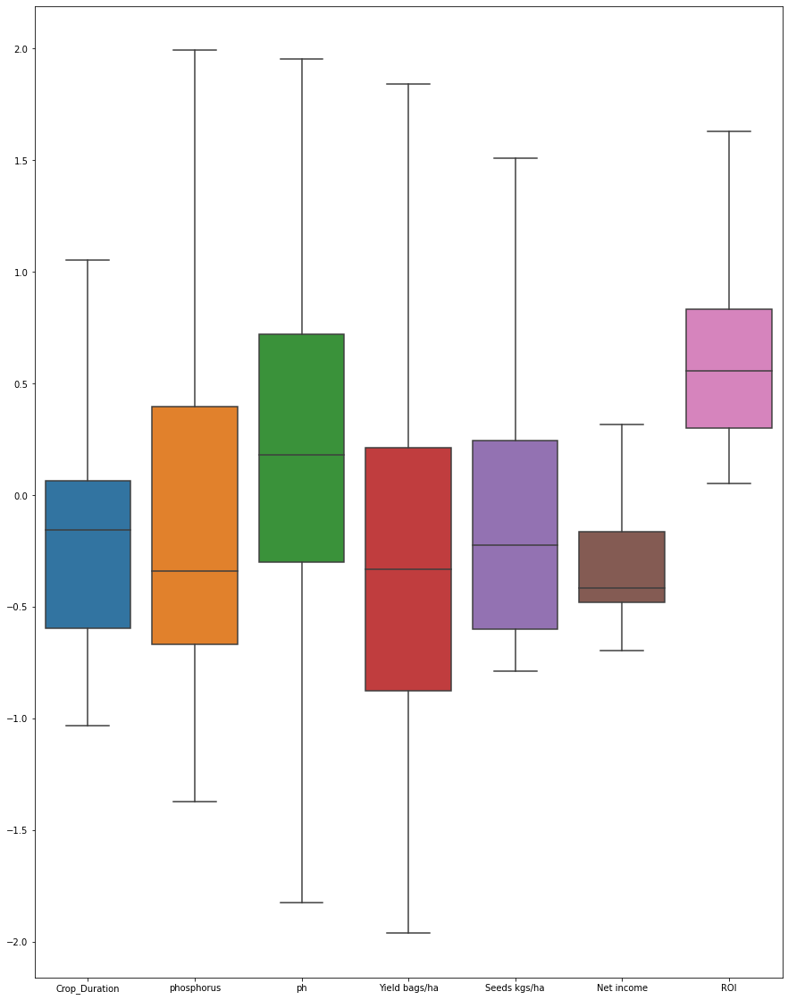

In [21]:
fig=plt.figure(figsize=(15,20))
sns.boxplot(data=df3)
plt.show()

In [22]:
df2.columns

Index(['Season', 'Crop', 'Crop_Duration', 'Nitrogen', 'phosphorus',
       'potassium', 'ph', 'Yield bags/ha', 'Seeds kgs/ha', 'Investment cost ',
       'Net income', 'ROI'],
      dtype='object')

In [23]:
# splitting the data into testing and training data.
from sklearn.model_selection import train_test_split
data=df2
X = ['Season', 'Crop', 'Crop_Duration', 'Nitrogen', 'phosphorus',
       'potassium', 'ph', 'Yield bags/ha', 'Seeds kgs/ha', 'Investment cost ',
       'Net income']
y= 'ROI'

X_train, X_test, y_train, y_test = train_test_split(df[X],
                                                    df[y],
                                                     test_size=0.20, random_state=42)

In [24]:
models_scores = [] # To store model scores

def rmse(model):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    return mean_squared_error(y_test, y_pred, squared= False) # squared= False > returns Root Mean Square Error       

In [25]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(criterion='mae',max_depth=6,min_samples_leaf=7,min_samples_split=8)

In [26]:
model.fit(X_train,y_train)

DecisionTreeRegressor(criterion='mae', max_depth=6, min_samples_leaf=7,
                      min_samples_split=8)

In [27]:
DecisionTree_Regressor = make_pipeline(DecisionTreeRegressor())
score = rmse(DecisionTree_Regressor)
models_scores.append(['DecisionTreeRegressor', score])
print(f'DecisionTreeRegressor Score= {score}')
predicted=model.predict(X_test)
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

DecisionTreeRegressor Score= 0.0061470461798741275
Mean squared error: 0.01
R Square score: 0.97


In [28]:
from sklearn.ensemble import AdaBoostRegressor
model = AdaBoostRegressor(n_estimators=22)
model.fit(X_train,y_train)
AdaBoost_Regressor = make_pipeline(AdaBoostRegressor())
score = rmse(AdaBoost_Regressor)
models_scores.append(['AdaBoostRegressor', score])
print(f' AdaBoostRegressor Score= {score}')
predicted=model.predict(X_test)
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

 AdaBoostRegressor Score= 0.09263051389595242
Mean squared error: 0.01
R Square score: 0.97


In [29]:
#to see the weights of the weak learners(models)
model.estimator_weights_



array([2.11553456, 1.59474341, 0.61484864, 1.17403243, 0.50133947,
       1.1232379 , 0.58488988, 1.53181569, 0.70040565, 1.78509329,
       1.09766035, 0.94485551, 1.05245391, 1.57599308, 0.70883278,
       0.8300673 , 1.4039401 , 0.95427137, 0.79518083, 1.68613974,
       0.97937885, 0.38198643])

In [30]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor(n_estimators=10,criterion='mse',
max_depth=9,min_samples_leaf=4,min_samples_split=5)
model.fit(X_train,y_train)
ExtraTrees_Regressor = make_pipeline(ExtraTreesRegressor())
score = rmse(ExtraTrees_Regressor)
models_scores.append(['ExtraTreesRegressor', score])
print(f' ExtraTreesRegressor Score= {score}')
predicted=model.predict(X_test)
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

 ExtraTreesRegressor Score= 0.0014687033821097434
Mean squared error: 0.00
R Square score: 1.00


In [31]:
from sklearn.ensemble import GradientBoostingRegressor
model = GradientBoostingRegressor(n_estimators=1000)
model.fit(X_train,y_train)
GradientBoosting_Regressor = make_pipeline(GradientBoostingRegressor())
score = rmse(GradientBoosting_Regressor)
models_scores.append(['GradientBoostingRegressor', score])
print(f' GradientBoostingRegressor Score= {score}')
predicted=model.predict(X_test)
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))


 GradientBoostingRegressor Score= 0.007525851306826611
Mean squared error: 0.00
R Square score: 1.00


In [32]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=100, criterion='mse',max_depth=9,min_samples_split=2,
min_samples_leaf=4)
model.fit(X_train,y_train)
RandomForest_Regressor = make_pipeline(RandomForestRegressor())
score = rmse(RandomForest_Regressor)

models_scores.append(['RandomForestRegressor', score])

predicted=model.predict(X_test)
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))
print(f' RandomForestRegressor Score= {score}')

Mean squared error: 0.00
R Square score: 1.00
 RandomForestRegressor Score= 0.005653419596484438


In [33]:
#Linear Regression
linear_regression = make_pipeline(LinearRegression())
score = rmse(linear_regression)

models_scores.append(['LinearRegression', score])
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

print(f'LinearRegression Score= {score}')

Mean squared error: 0.00
R Square score: 1.00
LinearRegression Score= 0.1957060222737506


In [34]:
#Lasso Regression
lasso = make_pipeline(RobustScaler(), Lasso(alpha=0.0005, random_state= random_state))

score = rmse(lasso)
models_scores.append(['Lasso', score])
print(f'Lasso Score= {score}')
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

Lasso Score= 0.19565757065610415
Mean squared error: 0.00
R Square score: 1.00


In [35]:
#ElasticNet Regression
elastic_net = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio= .9, random_state= random_state))

score = rmse(elastic_net)
models_scores.append(['ElasticNet', score])
print(f'ElasticNet Score= {score}')
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

ElasticNet Score= 0.19566240069351848
Mean squared error: 0.00
R Square score: 1.00


In [36]:
#KernelRidge Regression 
kernel_ridge= KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)
score = rmse(kernel_ridge)
models_scores.append(['KernelRidge', score])
print(f'KernelRidge Score= {score}')
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

KernelRidge Score= 0.04939086872734434
Mean squared error: 0.00
R Square score: 1.00


In [37]:
# Ranking the scores of each model
pd.DataFrame(models_scores).sort_values(by=[1], ascending=True)

,0,1
2,ExtraTreesRegressor,0.001469
4,RandomForestRegressor,0.005653
0,DecisionTreeRegressor,0.006147
3,GradientBoostingRegressor,0.007526
8,KernelRidge,0.049391
1,AdaBoostRegressor,0.092631
6,Lasso,0.195658
7,ElasticNet,0.195662
5,LinearRegression,0.195706


In [38]:
#gradient boosting regressor
gradient_boosting_regressor= GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state = random_state)

score = rmse(gradient_boosting_regressor)
models_scores.append(['GradientBoostingRegressor', score])
print(f'GradientBoostingRegressor Score= {score}')
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

GradientBoostingRegressor Score= 0.008140763621697208
Mean squared error: 0.00
R Square score: 1.00


In [39]:
#xg boosting regressor
xgb_regressor= xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213,verbosity=0, nthread = -1, random_state = random_state)
score = rmse(xgb_regressor)
models_scores.append(['XGBRegressor', score])
print(f'XGBRegressor Score= {score}')
print("Mean squared error: %.2f"
              % mean_squared_error(y_test, predicted))
print('R Square score: %.2f' % r2_score(y_test, predicted))

XGBRegressor Score= 0.025318534570564218
Mean squared error: 0.00
R Square score: 1.00


In [40]:
# Ranking the scores of each model
pd.DataFrame(models_scores).sort_values(by=[1], ascending=True)

,0,1
2,ExtraTreesRegressor,0.001469
4,RandomForestRegressor,0.005653
0,DecisionTreeRegressor,0.006147
3,GradientBoostingRegressor,0.007526
9,GradientBoostingRegressor,0.008141
10,XGBRegressor,0.025319
8,KernelRidge,0.049391
1,AdaBoostRegressor,0.092631
6,Lasso,0.195658
7,ElasticNet,0.195662


In [41]:
#GB builds an additive model in a forward stage-wise fashion;
#it allows for the optimization of arbitrary differentiable loss functions. 
#In each stage a regression tree is fit on the negative gradient of the given loss function.

In [42]:
#XGBoost is an optimized distributed gradient boosting library designed to be highly efficient, flexible and portable.
#It implements machine learning algorithms under the Gradient Boosting framework.
#XGBoost provides a parallel tree boosting (also known as GBDT, GBM) that solve many data science problems in a fast and accurate way.